<a href="https://colab.research.google.com/github/VladKuzR/DogsBreeds/blob/main/Dogs_Breeds_V1_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dog Breeds Prediction

**Abstract:** Welcome to our exciting journey of predicting dog breeds using neural networks! In this project, we explore the Stanford Dog Breeds Dataset and harness the power of Google Colab's GPUs. Our goal is to train an intelligent neural network that can accurately identify a dog's breed from its photo. We'll guide you through our process, from data preprocessing to building and fine-tuning our model. Join us on this adventure as we combine the worlds of technology and our love for dogs to create something extraordinary!

Also, in this GitHub repository, you will find the full Frontend and Backend codes for this application to work!

---

First, we must import all Python libraries necessary for building a model!

- `from google.colab import userdata` - for handling user data in Google Colab.
- `from google.colab import drive` - for accessing Google Drive files in Colab.
- `import os` - for interacting with the operating system, like file operations.
- `import re` - for regular expressions, useful in string manipulation.
- `import random` - for generating random numbers and randomizing data.
- `import datetime` - for manipulating dates and times.
- `import shutil` - for high-level file operations, such as copying and removal.
- `import numpy as np` - for numerical computations and array operations.
- `import pandas as pd` - for data manipulation and analysis.
- `import matplotlib.pyplot as plt` - for creating static, interactive, and animated visualizations.
- `import matplotlib.image as mpimg` - for reading and displaying images.
- `import cv2` - for image processing and computer vision tasks.
- `from bs4 import BeautifulSoup` - for parsing HTML and XML documents.
- `import tensorflow as tf` - for building and training machine learning models.
- `from tensorflow.keras.layers import *` - for defining layers in Keras models.
- `import tensorflow_hub as hub` - for accessing pre-trained models and modules.

In [ ]:
from google.colab import userdata
import os
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import datetime
import shutil
import cv2
from google.colab import drive
import random
from bs4 import BeautifulSoup
import tensorflow as tf
from tensorflow.keras.layers import *
import tensorflow_hub as hub

## Loading dataset

In this chapter, we'll load the Stanford Dog Breeds Dataset into our Google Colab environment. We'll access the dataset from Kaggle, unzip it, and organize it for easy processing. This setup will allow us to efficiently use the images and labels in our neural network model.

### Setting up neccessary credentials

I find it convenient to use Kaggle datasets, so I requested an API username and key and saved these credentials in the "Secret" tab of Colab. If you want to run the code, you'll need to do the same.

[How to use Kaggle API](https://www.kaggle.com/docs/api?utm_me=#getting-started-installation-&-authentication)

[Standford Dog Breeds Dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset)

In [ ]:
os.environ["KAGGLE_KEY"] = userdata.get('kaggle_key')
os.environ["KAGGLE_USERNAME"] = userdata.get('kaggle_username')

We set up all the credentials, it's time to download the Dataset!

In [ ]:
!kaggle datasets download -d jessicali9530/stanford-dogs-dataset

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset
License(s): other
 96% 719M/750M [00:02<00:00, 332MB/s]
100% 750M/750M [00:02<00:00, 305MB/s]


### Unzipping and preparing data

Great! Now we have `stanford-dogs-dataset.zip` downloaded to our workspace!

First, we have to unzip it! Next, I did a several moves for my convenience:
- I moved all the breed folders to the root directory (/content).
- I removed the previous version of the directory.
- Since Colab creates the `sample_data` directory, which we don't need, I deleted it.

In [ ]:
!unzip -q 'stanford-dogs-dataset.zip'
!mv /content/images/Images /content
!rm -r /content/images
!rm -r /content/sample_data

We have annotations in our dataset that show the exact locations of dogs in images. These annotations use detailed markers known as bounding box coordinates. To make use of these annotations, we need to create a function called "apply_annotations." This function will read HTML-formatted annotation files and crops the corresponding images based on the precise coordinates provided. This process ensures that our data is finely tuned and optimized for training machine learning models.

Nevertheless, one of the arguments will be `only_cropped`, which will save only cropped photos. Otherwise, both versions of the photo will be saved - cropped and not cropped.

In our workflow we will:
1. Apply annotations, cropping photos
2. Train our Models on cropped images
3. Select the best-performing model
4. Fine-tune it on both cropped and not cropped data.

In the **Version 2.0** of this program, alongside with the support of more breeds, we will be using the **Attention Mechanisms**. In this work we will keep it simpler.

---

Of course, we can use [tf.keras.layers.Cropping2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Cropping2D), but implementing the function before will give us more freedom.

In [ ]:
def apply_annotations(annotations_folder, images_folder, only_cropped=False):
    """
    Applies annotations to images in the specified directories.

    Args:
        annotations_folder (str): The path to the folder containing annotation files.
        images_folder (str): The path to the folder containing images.
        only_cropped (bool, optional): If True, removes original images after cropping.
                                        Defaults to False.

    Returns:
        None

    Raises:
        FileNotFoundError: If the specified directories or files within them are not found.
        ValueError: If the annotation files are not in the expected format.
        TypeError: If the annotation coordinates are not integers or missing.

    Notes:
        This function reads annotation files in HTML format and applies the bounding box
        coordinates to crop the corresponding images. It saves the cropped images in a
        subdirectory named "tmp" within each image category directory. If `only_cropped`
        is set to True, it removes the original images after cropping.
    """
    for dir in os.listdir(images_folder):
        for img in os.listdir(f'{images_folder}/{dir}'):
            if not '.jpg' in img:
                continue
            img = img.split('.')[0]
            image = cv2.imread(f'{images_folder}/{dir}/{img}.jpg')
            if only_cropped:
                os.remove(f'{os.path.join(images_folder, dir, img)}.jpg')

            with open(os.path.join(annotations_folder, dir, img), 'r', encoding='utf-8') as file:
                html_content = file.read()
            annotation = BeautifulSoup(html_content, 'html.parser')

            x_init = int(annotation.xmin.text)
            x_end = int(annotation.xmax.text)
            y_init = int(annotation.ymin.text)
            y_end = int(annotation.ymax.text)

            width = x_end - x_init
            height = y_end - y_init
            max_size = max(width, height)

            x_center = (x_init + x_end) // 2
            y_center = (y_init + y_end) // 2
            x_start = max(0, x_center - max_size // 2)
            y_start = max(0, y_center - max_size // 2)

            cropped_image = image[y_start:y_start + max_size, x_start:x_start + max_size]

            save_path = f'{os.path.join(images_folder, dir, "tmp", img)}_cropped.jpg'
            os.makedirs(os.path.join(images_folder, dir, "tmp"), exist_ok=True)
            cv2.imwrite(save_path, cropped_image)

        for image in os.listdir(os.path.join(images_folder, dir, "tmp")):
            shutil.move(f'{os.path.join(images_folder, dir, "tmp")}/{image}',
                        os.path.join(images_folder, dir))
        shutil.rmtree(os.path.join(images_folder, dir, "tmp"))


The function is ready, and looks beautiful! Now it is time to use it!

As was outlined above, initially we will be using the cropped versions of our photos.

In [ ]:
apply_annotations("/content/annotations/Annotation",
                  '/content/Images',
                  only_cropped=True)


Folders are ready! Let's explore them.
We will walk through Images directory and list number of files.

In [ ]:
images_numbers_array = []
for dirpath, dirnames, filenames in os.walk('Images'):
    print (f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}")
    if len(filenames) !=0:
      images_numbers_array.append(len(filenames))

There are 120 directories and 0 images in 'Images
There are 0 directories and 169 images in 'Images/n02105641-Old_English_sheepdog
There are 0 directories and 157 images in 'Images/n02097130-giant_schnauzer
There are 0 directories and 219 images in 'Images/n02112018-Pomeranian
There are 0 directories and 153 images in 'Images/n02112706-Brabancon_griffon
There are 0 directories and 252 images in 'Images/n02085936-Maltese_dog
There are 0 directories and 182 images in 'Images/n02091032-Italian_greyhound
There are 0 directories and 171 images in 'Images/n02088632-bluetick
There are 0 directories and 155 images in 'Images/n02113186-Cardigan
There are 0 directories and 196 images in 'Images/n02096294-Australian_terrier
There are 0 directories and 197 images in 'Images/n02095570-Lakeland_terrier
There are 0 directories and 156 images in 'Images/n02098105-soft-coated_wheaten_terrier
There are 0 directories and 156 images in 'Images/n02115641-dingo
There are 0 directories and 168 images in 'Ima

---
What a long list! Let's make it simple:

In [ ]:
print(f'The maximum number of images in all the folders is {max(images_numbers_array)},\n\
Minimum number is {min(images_numbers_array)}, \n\
Thу average number is {np.mean(images_numbers_array)}:')

The maximum number of images in all the folders is 252,
Minimum number is 148, 
Thу average number is 171.5:


What strange folder names?
`n02106662-German_shepherd` - why n? Why 02106662? Why do we need hyphens and underscores?

Let's rename all the folders so they have nothing redundant in their names.

In [ ]:
def rename_folders(folder_path):
    """
    Rename folders containing dogs' pictures.

    Parameters:
    - folder_path (str): The path to the directory containing the folders to be renamed.

    Returns:
    - None

    This function renames folders within the specified directory by removing prefixes like 'n\d+-'
    and replacing underscores with spaces. It also capitalizes the first letter of each folder name.
    """
    for folder_name in os.listdir(folder_path):
        new_folder_name = re.sub(r'n\d+-', '', folder_name)
        new_folder_name = re.sub(r'_', ' ', new_folder_name)
        new_folder_name = new_folder_name[0].capitalize()+new_folder_name[1:]
        os.rename(os.path.join(folder_path, folder_name),
                  os.path.join(folder_path, new_folder_name))


In [ ]:
rename_folders('Images')

### Familiarizing with the data

Congratulations! We now have 120 folders with names depicting each dog breed! Let's take a look at the data!

Now we make a `view_random_image` function to view some images.

In [ ]:
def view_random_image(target_dir):
    """
    View random images from the specified target directory.

    Parameters:
    - target_dir (str): The directory containing the images.

    Returns:
    - None

    This function randomly selects images from the specified directory and displays them using matplotlib.
    It plots a total of 6 images in a 3x3 grid, with each image accompanied by its folder name as the title.
    """
    # Setup the target directory (we'll view images from here)
    plt.figure(figsize=(16, 8))

    for i in range(8):

        # Get a random image path
        random_folder = random.sample(os.listdir(target_dir), 1)[0]
        random_image = random.sample(os.listdir(target_dir+'/'+random_folder), 1)

        # Read in the image and plot it using matplotlib
        plt.subplot(2, 4, i+1)
        img = mpimg.imread(f'{target_dir}/{random_folder}/{random_image[0]}')
        plt.imshow(img)
        plt.title(random_folder)
        plt.axis('off');



Perfect! Let's run it!

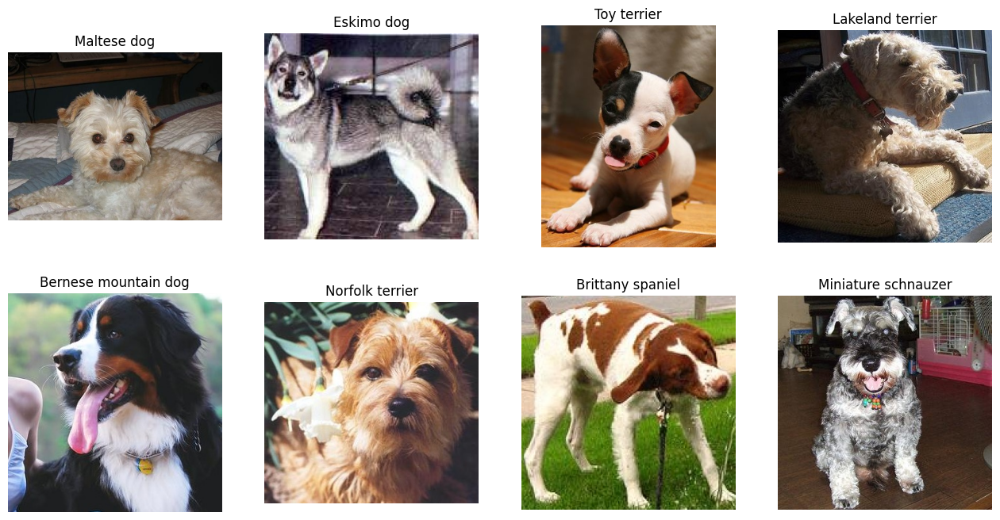

In [ ]:
view_random_image('Images')

## Preparing data


In this chapter our main goal is to organize and structure the Stanford Dog Breeds Dataset to make it optimal for machine learning training. This involves rearranging folders and dividing the dataset into training and validation sets. By carefully preparing our data, we make sure that our models receive well-organized inputs, which helps them learn and evaluate effectively. This chapter explains the steps taken to create a streamlined dataset ready for strong model training and validation.

### Preparing folders for using image_dataset_from_directory method

The function `make_train_test_folders` organizes dog images into training and testing sets. It creates a structured folder layout in the specified `target_folder`. Each breed of dog from the `source_folder` is sorted into subfolders within the `train` and `test` directories. This helps prepare the dataset for model training and evaluation.

In [ ]:
def make_train_test_folders (source_folder, target_folder, images_for_train = 100):
    """
    Create train and test folders for a dataset of dog images.

    Parameters:
    - source_folder (str): Path to the directory containing subfolders of dog breed images.
    - target_folder (str): Path to the directory where the train and test folders will be created.
    - images_for_train (int): Number of images per breed to be included in the training set. Default is 100.

    Returns:
    - None

    This function creates a train and test directory structure for organizing a dataset of dog images.
    It takes images from the source_folder, splits them into train and test sets, and copies them into
    the appropriate directories within the target_folder. Each breed has its own subfolder within the
    train and test directories.
    """
    # Create the target_folder directory if it doesn't exist yet
    os.makedirs(target_folder, exist_ok=True)

    # Create subfolders train and test
    train_folder = os.path.join(target_folder, 'train')
    test_folder = os.path.join(target_folder, 'test')
    os.makedirs(train_folder, exist_ok=True)
    os.makedirs(test_folder, exist_ok=True)

    # Get the list of dog breeds
    dog_breeds = os.listdir(source_folder)

    # Iterate through each breed
    for breed in dog_breeds:
        # Path to the source folder with photos of this breed
        breed_folder = os.path.join(source_folder, breed)

        # Create subfolders in train and test for this breed
        train_breed_folder = os.path.join(train_folder, breed)
        test_breed_folder = os.path.join(test_folder, breed)
        os.makedirs(train_breed_folder, exist_ok=True)
        os.makedirs(test_breed_folder, exist_ok=True)

        # Get the list of photos of this breed
        photos = sorted(os.listdir(breed_folder))

        # Number of photos for train
        train_count = min(images_for_train, len(photos))

        # Copy photos to train
        for photo in photos[:train_count]:
            src_path = os.path.join(breed_folder, photo)
            dest_path = os.path.join(train_breed_folder, photo)
            shutil.copy(src_path, dest_path)

        # Copy the remaining photos to test
        for photo in photos[train_count:train_count + images_for_train]:
            src_path = os.path.join(breed_folder, photo)
            dest_path = os.path.join(test_breed_folder, photo)
            shutil.copy(src_path, dest_path)



It's time to execute the function and get rid of unneccessary directories.

In [ ]:
make_train_test_folders(source_folder='Images',
                        target_folder='data/',
                        images_for_train=100)

!rm -r Images/
!rm -r annotations/

Then, we need to prepare our parameters for using `image_dataset_from_directory` function.

We chose a batch size of 32 and an image size of 224x224 to efficiently process multiple images at once, save memory, simplify model design, and work with pre-trained models.

In [ ]:
BATCH_SIZE = 32
IMG_HEIGHT = 224
IMG_WIDTH = 224

train_dir = 'data/train/'
test_dir = 'data/test/'

We use the TensorFlow function `image_dataset_from_directory` to efficiently prepare our dataset of dog breed images for machine learning model training. This function helps us create labeled batches of images directly from their respective directories by specifying parameters such as image size `(IMG_HEIGHT x IMG_WIDTH)`, batch size `(BATCH_SIZE)`, and labeling mode `(label_mode='categorical')`. This makes it easier to structure and integrate our data into our machine learning workflow.

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                       seed = 42,
                                                       image_size = (IMG_HEIGHT, IMG_WIDTH),
                                                       batch_size = BATCH_SIZE,
                                                       label_mode = 'categorical')

class_names = train_ds.class_names

Found 12000 files belonging to 120 classes.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                       seed = 42,
                                                       image_size = (IMG_HEIGHT, IMG_WIDTH),
                                                       batch_size = BATCH_SIZE,
                                                       shuffle = False,
                                                       label_mode = 'categorical')

Found 8326 files belonging to 120 classes.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['Affenpinscher', 'Afghan hound', 'African hunting dog', 'Airedale', 'American Staffordshire terrier', 'Appenzeller', 'Australian terrier', 'Basenji', 'Basset', 'Beagle', 'Bedlington terrier', 'Bernese mountain dog', 'Black-and-tan coonhound', 'Blenheim spaniel', 'Bloodhound', 'Bluetick', 'Border collie', 'Border terrier', 'Borzoi', 'Boston bull', 'Bouvier des Flandres', 'Boxer', 'Brabancon griffon', 'Briard', 'Brittany spaniel', 'Bull mastiff', 'Cairn', 'Cardigan', 'Chesapeake Bay retriever', 'Chihuahua', 'Chow', 'Clumber', 'Cocker spaniel', 'Collie', 'Curly-coated retriever', 'Dandie Dinmont', 'Dhole', 'Dingo', 'Doberman', 'English foxhound', 'English setter', 'English springer', 'EntleBucher', 'Eskimo dog', 'Flat-coated retriever', 'French bulldog', 'German shepherd', 'German short-haired pointer', 'Giant schnauzer', 'Golden retriever', 'Gordon setter', 'Great Dane', 'Great Pyrenees', 'Greater Swiss Mountain dog', 'Groenendael', 'Ibizan hound', 'Irish setter', 'Irish terrier', 'Iris

Awesome! Now we have training and validation datasets: former consists of 12000 images and the latter consists of 8580 images.

## Model's Accuracy Baseline

Before creating our first model, we need to establish a baseline. Since this dataset was previously utilized at Stanford University, we will use the accuracy of the work entitled as "[Novel dataset for Fine-Grained Image Categorization](http://vision.stanford.edu/aditya86/ImageNetDogs/)" as the baseline.

The researchers experimented with the number of images per category, ranging from 1 to 100.

Since we have chosen 100 training images per class, we will use the researcher's experiment result with 100 images per class as our baseline, which is 22% on average.

## Using Traditional Approach to Building Convolutional Networks

This section goes over the traditional way of building convolutional neural networks (CNNs) for image classification. We start by creating utility functions like `create_tensorboard_callback` to help visualize model training using TensorBoard. Then, we create our first CNN model `model_1` with layers like convolutional `Conv2D`, pooling `MaxPool2D`, and dense `Dense` to classify dog breed images from our dataset. We set the model to use the right loss and optimizer settings, and monitor its performance across epochs using metrics such as accuracy and loss. We also visualize the training history of `model_1` to track its training progress.

In [ ]:
def create_tensorboard_callback(dir_name, experiment_name):
  """
  Creates a TensorBoard callback instand to store log files.

  Stores log files with the filepath:
    "dir_name/experiment_name/current_datetime/"

  Args:
    dir_name: target directory to store TensorBoard log files
    experiment_name: name of experiment directory (e.g. efficientnet_model_1)
  """
  log_dir = 'TensorBoard_Folder/' + dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '/'
  tensorboard_callback = tf.keras.callbacks.TensorBoard(
      log_dir=log_dir
  )
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

### Building the First Model

Time to build the first Convolutional Neural Network! Are you excited?
This model will consist only of two convolutional layers,  one max pooling layer, a flattened layer, and a dense layer.
These layers hold the following purposes:
* **Convolutional Layers (Conv2D)** extracts features from input images using filters, enabling the network to learn hierarchical representations.
* **Max Pooling Layer (MaxPool2D)** reduces the spatial dimensions of feature maps, enhancing computational efficiency and promoting translation invariance.
* **Flatten Layer** reshapes 2D feature maps into a 1D vector, preparing data for the dense layer.
* **Dense Layer** performs classification based on the features extracted by the previous layers, mapping them to output classes.

---
We're using Sequential Tensorflow API to build a model:

In [ ]:
model_1 = tf.keras.Sequential([
    Conv2D(64, 5, padding = 'valid', activation = 'relu'),
    Conv2D(64, 5, padding = 'valid', activation = 'relu'),
    MaxPool2D(),

    Conv2D(64, 5, padding = 'valid', activation = 'relu', name = 'Conv_layer_1'),
    Conv2D(64, 5, padding = 'valid', activation = 'relu', name = 'Conv_layer_2'),
    MaxPool2D(name = 'Max_pooling_layer'),

    Flatten(name = 'Flatten_layer'),

    Dense(len(class_names), activation = 'softmax', name = 'Output_layer')
])

Then, we compile the model to configure its learning process, specifying the optimizer, loss function, and metrics to evaluate its performance during training and testing.

In [ ]:
model_1.compile(loss = 'categorical_crossentropy',
                optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001),
                metrics = ['accuracy'])

Finally! Time to train our first Convolutional Neural Network!
We want to save training metrics to `history_1` variable so thay we can review them later.

In [ ]:
history_1 = model_1.fit(train_ds,
            epochs = 15,
            validation_data = val_ds,
            batch_size = 32,
            validation_steps = int(len(val_ds)),
            callbacks = [create_tensorboard_callback(dir_name = 'general_CV',
                                                     experiment_name = 'model_1_initial')])

Saving TensorBoard log files to: TensorBoard_Folder/general_CV/model_1_initial/20240704-013008/
Epoch 1/15
375/375 [==============================] - 26s 48ms/step - loss: 6.5160 - accuracy: 0.0159 - val_loss: 4.7049 - val_accuracy: 0.0240
Epoch 2/15
375/375 [==============================] - 18s 47ms/step - loss: 3.2913 - accuracy: 0.2713 - val_loss: 5.6315 - val_accuracy: 0.0295
Epoch 3/15
375/375 [==============================] - 18s 47ms/step - loss: 1.6959 - accuracy: 0.6187 - val_loss: 8.8681 - val_accuracy: 0.0276
Epoch 4/15
375/375 [==============================] - 18s 47ms/step - loss: 0.9191 - accuracy: 0.7993 - val_loss: 14.0131 - val_accuracy: 0.0276
Epoch 5/15
375/375 [==============================] - 18s 47ms/step - loss: 0.4883 - accuracy: 0.8942 - val_loss: 23.9074 - val_accuracy: 0.0293
Epoch 6/15
375/375 [==============================] - 18s 47ms/step - loss: 0.2935 - accuracy: 0.9398 - val_loss: 31.9492 - val_accuracy: 0.0298
Epoch 7/15
375/375 [=================

**Our accuracy is almost 100%!**

Good, isn't it?

In fact, the reference parameter for us is `val_accuracy`, which remains around 7%. This is much better than random guessing, but it still doesn't surpass our baseline!

Again. Accuracy on training set is almost 100%, but validation accuracy is about 7%. Why is it happening?

Remember, we have `history_1` that contains the training metrics? Let's look at it closer. For this, we need to create the `plot_history` function that would depict us the training process features.

In [ ]:
def plot_history(history):
    """
    Plots training and validation loss and accuracy from a Keras History object.

    Parameters:
    history (keras.callbacks.History): A History object from training a Keras model.

    Returns:
    None
    """
    loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' not in s]
    val_loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' in s]
    acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' not in s]
    val_acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' in s]

    if len(loss_list) == 0:
        print('Loss is missing in history')
        return

    # As loss always exists
    epochs = range(1,len(history.history[loss_list[0]]) + 1)

    # Loss
    plt.figure(1)
    for l in loss_list:
        plt.plot(epochs, history.history[l], 'b', label='Training loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    for l in val_loss_list:
        plt.plot(epochs, history.history[l], 'g', label='Validation loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))

    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy
    plt.figure(2)
    for l in acc_list:
        plt.plot(epochs, history.history[l], 'b', label='Training accuracy (' + str(format(history.history[l][-1],'.5f'))+')')
    for l in val_acc_list:
        plt.plot(epochs, history.history[l], 'g', label='Validation accuracy (' + str(format(history.history[l][-1],'.5f'))+')')

    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

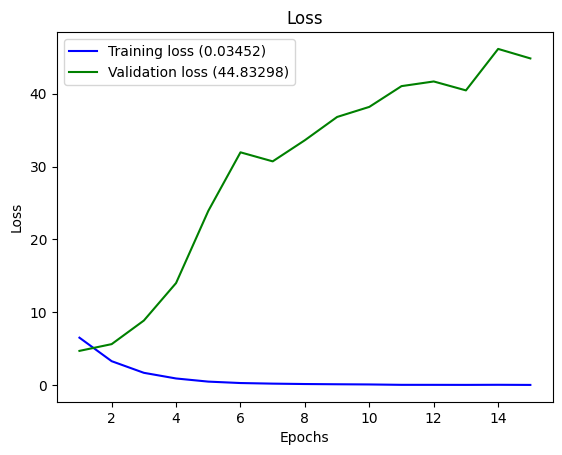

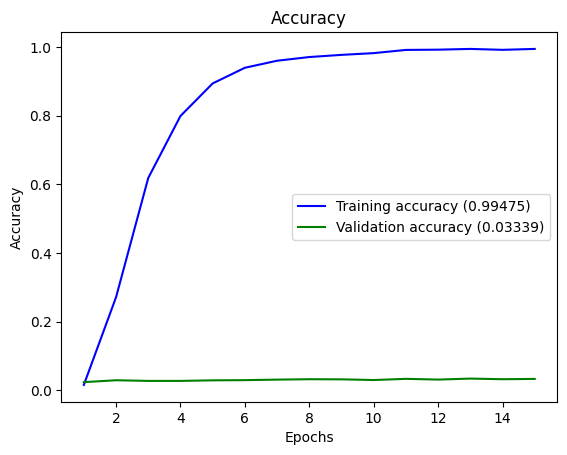

In [ ]:
plot_history(history_1)

* Training loss decreases dramatically
* Validation loss fluctuates without a trend
---
* Training accuracy flies to the sky immediately
* Validation accuracy is low and doesn't want to improve

> What is the issue here?

The issue here is known as **overfitting.** Since we have limited data and our model is quite basic (we are not using anything to prevent overfitting), it essentially memorizes the images it has been trained on, resulting in a high accuracy of 99.8%. However, it loses the ability to generalize, meaning it only recognizes familiar images and not the common features of an object that could be similar in other images of the same dog.

To address this issue, the first essential tool in our arsenal is **data augmentation.**


### Performing Data Augmentation

We have limited data, so we're thinking of using data augmentation to increase its diversity. Data augmentation means changing the original images in various ways to create more diverse training data. This can help the model generalize better.

In [ ]:
normalization_layer = Rescaling(1./255)
resize_layer = Resizing(
    IMG_HEIGHT,
    IMG_WIDTH
)
flip_layer = RandomFlip('horizontal',
                               input_shape = (IMG_HEIGHT, IMG_WIDTH, 3))
rotation_layer = RandomRotation(0.2)
zoom_layer = RandomZoom(0.2)
crop_layer = RandomCrop(IMG_HEIGHT, IMG_WIDTH)
translation_layer = RandomTranslation(0.1, 0.1)

Let's take a closer look at all the tools we used:

* **Normalization:** Rescaling(1./255) - Converts pixel values from a range of 0-255 to a range of 0-1.
* **Resize:** Resizing(IMG_HEIGHT, IMG_WIDTH) - Changes the size of images to the specified height and width.
* **Flip:** RandomFlip('horizontal', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)) - Randomly flips images horizontally.
* **Rotation:** RandomRotation(0.2) - Rotates images randomly by up to 20% of 360 degrees.
* **Zoom:** RandomZoom(0.2) - Randomly zooms in on images by up to 20%.
* **Crop:** RandomCrop(IMG_HEIGHT, IMG_WIDTH) - Randomly crops images to the specified height and width.
* **Translation:** RandomTranslation(0.1, 0.1) - Randomly shifts images horizontally and vertically by up to 10%.

And we can combine all these layers in one, again usine TensorFlow Sequential API.

In [ ]:
preprocessing_model = tf.keras.Sequential([
    normalization_layer,
    resize_layer,
    flip_layer,
    rotation_layer,
    zoom_layer,
    crop_layer,
    translation_layer
])

What do we have now? How does it affect our images?

Let's check by depicting original images, and ones were processed with our preprocessing layer!

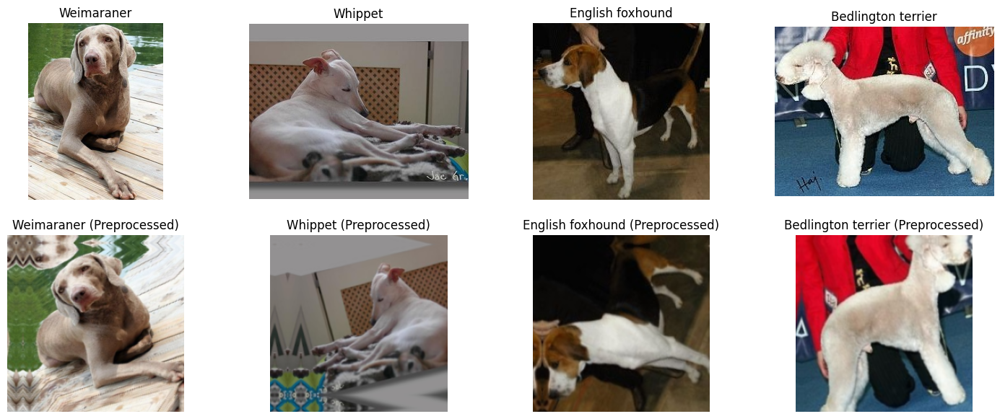

In [ ]:
target_dir = 'data/train'
plt.figure(figsize=(18, 7))

for i in range(4):

    # Get a random image path
    random_folder = random.sample(os.listdir(target_dir), 1)[0]
    random_image = random.sample(os.listdir(target_dir+'/'+random_folder), 1)[0]

    # Read in the image and plot it using matplotlib
    plt.subplot(2, 4, i+1)
    img = mpimg.imread(f'{target_dir}/{random_folder}/{random_image}')
    plt.imshow(img)
    plt.title(random_folder)
    plt.axis('off')

    plt.subplot(2, 4, i+5)
    img = mpimg.imread(f'{target_dir}/{random_folder}/{random_image}')
    img = preprocessing_model(img)
    plt.imshow(img)
    plt.title(random_folder + ' (Preprocessed)')
    plt.axis('off')

Now, our model will not be memorizing all the pictures, as they are all different. We will force it to remember not photos but patterns and features on the image!

---

To improve the efficiency and speed of data loading during training, we want to use the prefetch method:

When working with the training data, we first shuffle it and then divide it into batches. After that, we use `train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)` to prepare the next batch of data while the current batch is being processed. This speeds up the training process.

As for the validation data, we convert it into batches and use `val_ds.prefetch(tf.data.AUTOTUNE)` to prefetch it. Since the validation data doesn't need to be shuffled, this method ensures efficient loading during model evaluation.

If you want to know more, visit [this page](https://www.tensorflow.org/guide/data_performance).

In [ ]:
# Shuffle train_data and turn it into batches and prefetch it (load it faster)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

# Turn test data into batches
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

We expect our performance to be better now! Let's make function for using one more callback.

We use the `create_model_checkpoint_callback` function to save our best model during training. It saves the model when it performs better on the validation set, ensuring we always have a backup of the best version in case something goes wrong during training. The function creates a folder with a unique timestamp to store these backups and shows the location for easy reference.

In [ ]:
def create_model_checkpoint_callback(dir_name, model_name):
    """
    Creates a callback function to save the model's weights during training.

    Parameters:
    dir_name (str): Directory name for storing checkpoints.
    model_name (str): Name of the model for creating a specific checkpoint folder.

    Returns:
    tf.keras.callbacks.ModelCheckpoint: Callback function to save model weights.
    """
    checkpoint_dir = os.path.join('Checkpoint_Folder', dir_name, model_name,
                                  datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    os.makedirs(checkpoint_dir, exist_ok=True)

    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, 'model_weights.h5'),
        monitor='val_loss',
        verbose=1,
        save_best_only=True,
        )

    print(f"Saving Model Checkpoint to: {checkpoint_dir}")
    return checkpoint_callback

### Model 2 - Using Augmented Data

Okay, we created Data Augmentation layers, prefetched data for faster training, created convenient functions for using TensorFlow Callbacks.

Let's try new model out!

In [ ]:
model_2 = tf.keras.Sequential([
    normalization_layer,
    flip_layer,
    rotation_layer,
    zoom_layer,
    crop_layer,
    translation_layer,

    Conv2D(64, 5, padding = 'valid', activation = 'relu', name = 'Conv_layer_1'),
    Conv2D(64, 5, padding = 'valid', activation = 'relu', name = 'Conv_layer_2'),
    MaxPool2D(),

    Conv2D(64, 5, padding = 'valid', activation = 'relu', name = 'Conv_layer_3'),
    Conv2D(64, 5, padding = 'valid', activation = 'relu', name = 'Conv_layer_4'),
    MaxPool2D(name = 'Max_pooling_layer'),

    Flatten(name = 'Flatten_layer'),

    Dense(len(class_names), activation = 'softmax', name = 'Output_layer')
])

model_2.compile(loss = 'categorical_crossentropy',
                optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001),
                metrics = ['accuracy'])

history_2 = model_2.fit(train_ds,
            epochs = 15,
            validation_data = val_ds,
            batch_size = 32,
            validation_steps = int(len(val_ds)),
            callbacks = [create_tensorboard_callback(dir_name = 'general_CV',
                                                     experiment_name = 'model_2_augmented')])

Saving TensorBoard log files to: TensorBoard_Folder/general_CV/model_2_augmented/20240704-013444/
Epoch 1/15
375/375 [==============================] - 22s 52ms/step - loss: 4.6507 - accuracy: 0.0179 - val_loss: 4.4298 - val_accuracy: 0.0388
Epoch 2/15
375/375 [==============================] - 19s 51ms/step - loss: 4.3383 - accuracy: 0.0456 - val_loss: 4.2241 - val_accuracy: 0.0632
Epoch 3/15
375/375 [==============================] - 19s 51ms/step - loss: 4.1837 - accuracy: 0.0652 - val_loss: 4.1141 - val_accuracy: 0.0778
Epoch 4/15
375/375 [==============================] - 19s 51ms/step - loss: 4.0893 - accuracy: 0.0776 - val_loss: 4.0459 - val_accuracy: 0.0873
Epoch 5/15
375/375 [==============================] - 19s 51ms/step - loss: 4.0019 - accuracy: 0.0943 - val_loss: 3.9814 - val_accuracy: 0.0968
Epoch 6/15
375/375 [==============================] - 19s 51ms/step - loss: 3.9120 - accuracy: 0.1055 - val_loss: 3.8964 - val_accuracy: 0.1092
Epoch 7/15
375/375 [==================

Awesome, now we do not have overfitting! Training and validation accuracies are almost equal.

Let's take a look at the plots!

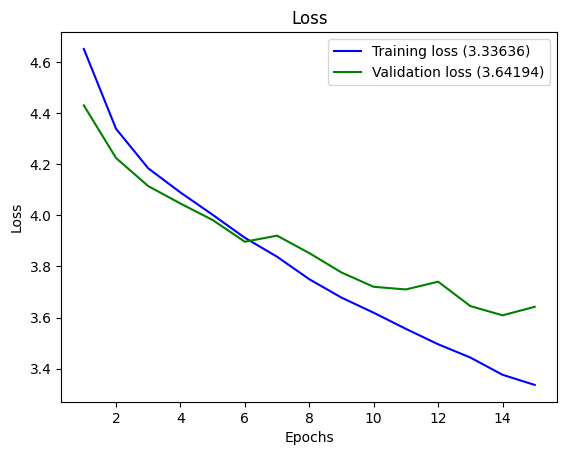

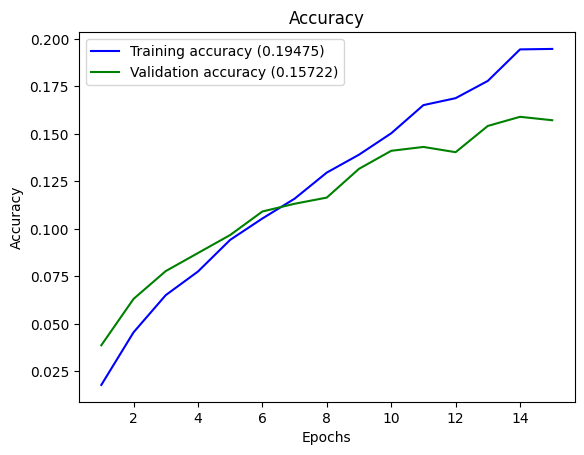

In [ ]:
plot_history(history_2)

Perfect, now two loss curves go down and two accuracies go up hand in hand!

We better notice that by the end of 15th epoch, the improvement of model's performance did not stop! We still can train this simple model, and it probably will beat our baseline!

---


Remember, we were using TensorBoard callback? It's time to check the dashboard that depicts our learning processes.

In [ ]:
%load_ext tensorboard

UPD. I needed to delete the code chunk with `%tensorboard --logdir TensorBoard_Folder/general_CV` because it significantly increases the size of this notebook. As a result, GitHub cannot  display it.

However, if you run this notebook in Colab, creating and running this chunk will allow the graphs in the TensorBoard app to manage them.

However, we have one TensorBoard app working below. It looks like this:

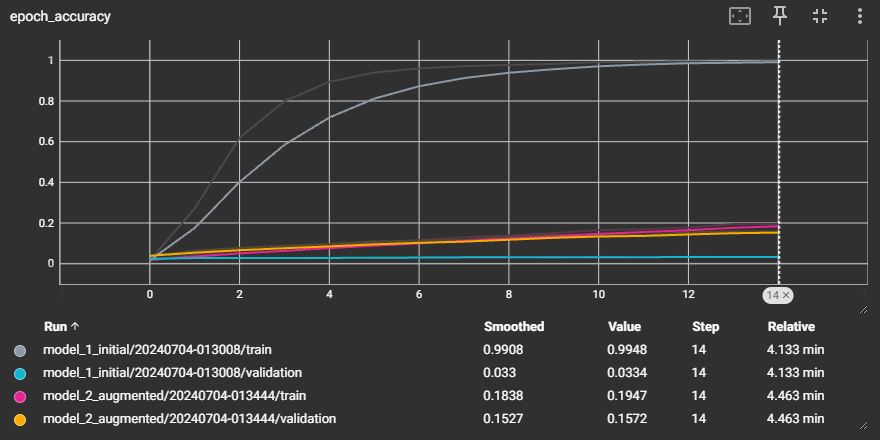

These are the same grapes we built using the function `plot_history`; however, the TensorBoard application offers more functions and interactivity.

Graphs show us that **data augmentation** contributed successfully to the improvement of our model! *(Remember, we did not change anything else)*

### Hyperparameters tuning

Our previous models had:
* Two Convolutional Layers with 16 filters each with kernel size 5
* Max Pooling Layer
* Flatten Layer
* Dense Layer

Is it the best model architecture?  Of course not..

But how to understand, how to enhance the model? Experimenting...

Can we make it automatically? Yes!

Hyperparameter tuning is a crucial part of machine learning. It involves adjusting the settings of a model to improve its performance. These settings, called hyperparameters, control how the model learns and its structure, affecting how well it works on a specific task. Unlike model parameters, which are learned during training, hyperparameters have to be set before training starts.

Let's take a look, which types of Hyperparameter Tuning exist:

- **Grid Search:**
Grid search is an exhaustive search technique that explores every possible combination of hyperparameters specified in a grid. While it's straightforward, it can be computationally expensive.

- **Random Search:**
Random search samples random combinations of hyperparameters from a predefined range. It's less exhaustive than grid search but often finds good results faster.

- **Bayesian Optimization:**
Bayesian optimization builds a probabilistic model of the objective function and uses it to select the most promising hyperparameters to evaluate. It balances exploration and exploitation.

- **Hyperband:**
Hyperband is an efficient hyperparameter optimization technique that combines random sampling and adaptive resource allocation. It quickly narrows down the best hyperparameters by allocating more resources to promising configurations.d adaptive resource allocation to quickly narrow down the best hyperparameters.

In [ ]:
!pip install keras-tuner -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.5 MB/s eta 0:00:00


It's now the time to create another model that differs from the previous ones. We will add layers that can be included or excluded and iterate through their parameters.

In [ ]:
import keras_tuner
from tensorflow.keras import layers
from tensorflow.keras import Sequential

def build_model(hp):
    """
    Builds a convolutional neural network model with hyperparameter tuning using Keras Tuner.

    Parameters:
    hp (keras_tuner.engine.hyperparameters.HyperParameters): HyperParameters object for defining tunable parameters.

    Returns:
    tf.keras.models.Sequential: Compiled Keras model.
    """
    model = Sequential()
    model.add(preprocessing_model)
    for i in range(hp.Int("num_layers", 2, 3, 4)):
        model.add(
            layers.Conv2D(
                filters=hp.Int(f"units_{i}", min_value=16, max_value=64, step=2, sampling="log"),
                kernel_size=hp.Choice('kernel_size', values=[3, 5]),
                padding='valid',
                activation='relu'
            )
        )
        if hp.Boolean("conv2"):
            model.add(
                layers.Conv2D(
                    filters=hp.Int(f"units_{i}", min_value=16, max_value=64, step=2, sampling="log"),
                    kernel_size=hp.Choice('kernel_size', values=[3, 5]),
                    padding='valid',
                    activation='relu'
                )
            )
        model.add(layers.MaxPool2D())

    model.add(layers.Flatten())

    if hp.Boolean("dropout"):
        model.add(layers.Dropout(rate=0.25))

    model.add(layers.Dense(len(class_names), activation="softmax"))
    learning_rate = hp.Choice('lr', values=[1e-3, 1e-4, 1e-5])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss="categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model

I have chosen `RandomSearch` from all the available options above. It will randomly iterate through parameters that I've set.

In version 2.0 of this project, we will be using Bayesian optimization as more advanced!

In [ ]:
tuner = keras_tuner.RandomSearch(
    build_model,
    max_trials=30,
    overwrite=True,
    # Do not resume the previous search in the same directory.
    objective="val_accuracy",
    # Set a directory to store the intermediate results.
    directory="/tmp/tb",
)

Perfect, our tuner is ready!

Let's check it's summary:

In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 7
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 3, 'step': 4, 'sampling': 'linear'}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 64, 'step': 2, 'sampling': 'log'}
kernel_size (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
conv2 (Boolean)
{'default': False, 'conditions': []}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 64, 'step': 2, 'sampling': 'log'}
dropout (Boolean)
{'default': False, 'conditions': []}
lr (Choice)
{'default': 0.001, 'conditions': [], 'values': [0.001, 0.0001, 1e-05], 'ordered': True}


Now let the search start.

In [ ]:
tuner.search(
    train_ds,
    validation_data = val_ds,
    epochs=20,
    # Use the TensorBoard callback.
    callbacks=[create_tensorboard_callback(dir_name = 'hyperparameter_tuning',
                                                     experiment_name = 'hyperparameter_tuning'),
               tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                     min_delta=0.01, patience=3)],
)

Trial 30 Complete [00h 01m 34s]
val_accuracy: 0.08875810354948044

Best val_accuracy So Far: 0.13812154531478882
Total elapsed time: 00h 49m 58s


Surprisingly, although it took 50 minutes, it did not overtake our `model_2`. It is not a problem, as we did not try to check all the possible model architectures and did not use anything especially advanced.

Our best model so far gained almost **16% accuracy**, which nearly reaches our baseline.

## Transfer Learning - Feature Extraction

Transfer learning is a powerful technique in machine learning where a model developed for one task is reused as the starting point for a model on a second task. It relies on pre-trained models that have been trained on large datasets, allowing you to benefit from the learned features and avoid starting from scratch. This approach is particularly useful when you have limited data for your specific task, as it can significantly speed up training and improve performance.

In this chapter, we will explore how to apply transfer learning to our convolutional neural network for dog breed classification. We'll start by using a pre-trained model, adapting it to our dataset through fine-tuning, and showing how this can enhance our model's accuracy and efficiency.

### Using mixed precision

We're enabling mixed precision training to make the most of both 16-bit and 32-bit floating-point operations during model training. This optimization helps cut down on memory use and speeds up computation, especially on hardware like GPUs that support mixed precision. By using mixed precision, we aim to achieve faster training times and potentially handle larger models or use bigger batch sizes without memory limitations.

If you're interested to know more, visit [this website](https://www.tensorflow.org/guide/mixed_precision).

In [ ]:
# Turn on mixed precision training
from tensorflow.keras import mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy) # set global policy to mixed precision

Great, let's check it:

In [ ]:
mixed_precision.global_policy()

<Policy "mixed_float16">

Awesome! Out GPU is compatible with mixed precision (Of course, I use Google Colab Pro)!

In [ ]:
print('Compute dtype: %s' % policy.compute_dtype)
print('Variable dtype: %s' % policy.variable_dtype)

Compute dtype: float16
Variable dtype: float32


### Getting Feature Vectors Using Different Base Models

As we're planning to use several different base models for choosing the best, let's make a function for it!

Here's how we'll do it:

1. **Create the base model:** We will use a pre-trained model from `tf.keras.applications`, excluding its top layer and specifying the input shape to match our images.
2. **Freeze the base model:** To retain the pre-learned patterns from the pre-trained model, we will set the base model's trainable attribute to False.
3. **Create inputs into the base model:** We will define the input layer with the same shape as our images and preprocess these inputs using our preprocessing model.
4. **Preprocess inputs based on the model type:** Depending on the chosen model architecture, we will apply the appropriate preprocessing function. For EfficientNet, we will use its specific preprocessing function.
5. **Pass inputs to the base model:** The preprocessed inputs are then fed into the base model, and we will print the shape to check the data structure at this point.
6. **Global Average Pooling:** We will apply a global average pooling layer to reduce the dimensionality and aggregate important information from the base model's outputs.
7. **Create the output layer:** We will add a dense layer with a softmax activation to generate the final class probabilities.
8. **Combine inputs and outputs:** We will combine the input and output layers to create the final model.
9. **Compile the model:** Finally, we will compile the model using categorical cross-entropy loss, the Adam optimizer with a learning rate of 0.0001, and accuracy as the evaluation metric.




In [ ]:
def build_model(model = 'EfficientNetB0'):
    """
    Builds a transfer learning model using a specified pre-trained base model.

    Parameters:
    model (str): Name of the pre-trained model to use ('EfficientNetB0', 'MobileNet', 'ResNet').

    Returns:
    tf.keras.Model: Compiled Keras model with the specified base model and classification layers.
    """

    # 1. Create base model with tf.keras.applications
    base_model = pretrained_models[model](include_top = False,
                                          input_shape = (IMG_HEIGHT,
                                                         IMG_WIDTH, 3))

    # 2. Freeze the base model (so the pre-learned patterns remain)
    base_model.trainable = False

    # 3. Create inputs into the base model
    inputs = tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                   name="input_layer")

    # 4. Preprocess accordingly
    if "MobileNet" in model:
        x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
    elif "ResNet" in model:
        x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
    else:
        x = tf.keras.applications.efficientnet.preprocess_input(inputs) # pass through


    # 5. Pass the inputs to the base_model (note: using tf.keras.applications, EfficientNetV2 inputs don't have to be normalized)
    x = base_model(x, training=False)

    # Check data shape after passing it to base_model
    print(f"Shape after base_model: {x.shape}")

    # 6. Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
    x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    print(f"After GlobalAveragePooling2D(): {x.shape}")

    # 7. Create the output activation layer
    x = tf.keras.layers.Dense(len(class_names))(x)

    outputs = tf.keras.layers.Activation("softmax", dtype=tf.float32,
                                         name="softmax_float32")(x)

    # 8. Combine the inputs with the outputs into a model
    model = tf.keras.Model(inputs, outputs)

    # 9. Compile the model
    model.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                metrics=["accuracy"])

    return model


Alright, our function is ready, now we need to choose and specify several base models that we will be using:

* **EfficientNetB0:** A lightweight model with a good balance between speed and accuracy, making it suitable for limited computational resources.
* **EfficientNetB7:** The largest model in the EfficientNet family, offering high accuracy but requiring more computational power.
* **EfficientNetV2B0:** An improved version of EfficientNetB0 with better performance and efficiency.
* **EfficientNetV2B3:** A more advanced model in the EfficientNetV2 series, providing a balance between size and performance.
* **MobileNetV2:** Known for its efficiency on mobile and embedded devices, it offers a good trade-off between model size and accuracy.
* **ResNet50V2:** A powerful and widely-used architecture, known for its deep layers and ability to handle complex image recognition tasks.

In [ ]:
# We will be using following architectures:
pretrained_models = {'EfficientNetB0': tf.keras.applications.EfficientNetB0,
                     'EfficientNetB7': tf.keras.applications.EfficientNetB7,
                     'EfficientNetV2B0': tf.keras.applications.EfficientNetV2B0,
                     'EfficientNetV2B3': tf.keras.applications.EfficientNetV2B3,
                     'MobileNetV2': tf.keras.applications.MobileNetV2,
                     'ResNet50V2': tf.keras.applications.ResNet50V2}

### Building the Model Based on EfficientNetB0

Let's make our first model with `EfficientNetB0` solely and train it.

When training machine learning models, callbacks play a crucial role in monitoring the training process, saving intermediate models, and stopping training when necessary conditions are met. Here are the callbacks used:

1. **TensorBoard Callback** - Logs training metrics for visualization in TensorBoard, allowing real-time tracking and analysis of training and validation metrics.

2. **Early Stopping Callback** - Monitors validation accuracy and stops training if it does not improve by a specified amount (min_delta) within a certain number of epochs (patience).

3. **Model Checkpoint Callback** - Saves the model's weights at specified intervals, particularly when there is an improvement in the monitored metric, ensuring the best model is saved.

In [ ]:
EfficientNetB0_model = build_model(model = 'EfficientNetB0')

# 10. Fit the model (we use less steps for validation so it's faster)
EfficientNetB0_model_history = EfficientNetB0_model.fit(train_ds,
            epochs=50,
            steps_per_epoch=len(train_ds),
            validation_data=val_ds,
            # Go through less of the validation data so epochs are faster
            validation_steps=int(0.25 * len(val_ds)),
            # Track our model's training logs for visualization later
            callbacks=[create_tensorboard_callback(dir_name= 'feature_extraction',
                                                   experiment_name = "EfficientNetB0"),
                       tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                     min_delta=0.005, patience=2),
                       create_model_checkpoint_callback(dir_name='Transfer_Learning',
                                                        model_name='EfficientNetB0')])



16705208/16705208 [==============================] - 0s 0us/step
Shape after base_model: (None, 7, 7, 1280)
After GlobalAveragePooling2D(): (None, 1280)
Saving TensorBoard log files to: TensorBoard_Folder/feature_extraction/EfficientNetB0/20240708-020137/
Saving Model Checkpoint to: Checkpoint_Folder/Transfer_Learning/EfficientNetB0/20240708-020137
Epoch 1/50
373/375 [============================>.] - ETA: 0s - loss: 3.8216 - accuracy: 0.3397
Epoch 1: val_loss improved from inf to 2.89492, saving model to Checkpoint_Folder/Transfer_Learning/EfficientNetB0/20240708-020137/model_weights.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


375/375 [==============================] - 21s 30ms/step - loss: 3.8166 - accuracy: 0.3409 - val_loss: 2.8949 - val_accuracy: 0.6538
Epoch 2/50
373/375 [============================>.] - ETA: 0s - loss: 2.2537 - accuracy: 0.7458
Epoch 2: val_loss improved from 2.89492 to 1.73742, saving model to Checkpoint_Folder/Transfer_Learning/EfficientNetB0/20240708-020137/model_weights.h5
375/375 [==============================] - 9s 25ms/step - loss: 2.2510 - accuracy: 0.7462 - val_loss: 1.7374 - val_accuracy: 0.8236
Epoch 3/50
373/375 [============================>.] - ETA: 0s - loss: 1.4242 - accuracy: 0.8262
Epoch 3: val_loss improved from 1.73742 to 1.16832, saving model to Checkpoint_Folder/Transfer_Learning/EfficientNetB0/20240708-020137/model_weights.h5
375/375 [==============================] - 10s 25ms/step - loss: 1.4227 - accuracy: 0.8262 - val_loss: 1.1683 - val_accuracy: 0.8639
Epoch 4/50
373/375 [============================>.] - ETA: 0s - loss: 1.0169 - accuracy: 0.8556
Epoch 4: v

### Building the Model using other Models

Wow! Our first model achieved an 89% accuracy on a quarter of the validation dataset. Let's train models with other base models and compare them.

In [ ]:
for model_name in list(pretrained_models.keys())[1:]:
    print(f'Fitting {model_name} model')


    # Build the model
    model = build_model(model=model_name)

    # Training setup
    history = model.fit(
        train_ds,
        epochs=50,
        verbose=2,
        steps_per_epoch=len(train_ds),
        validation_data=val_ds,
        validation_steps=int(0.25 * len(val_ds)),
        callbacks=[create_tensorboard_callback(dir_name= 'feature_extraction',
                                               experiment_name = model_name),
                   tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                     min_delta=0.005, patience=3),
                   create_model_checkpoint_callback(dir_name='Transfer_Learning',
                                                        model_name=model_name)]
    )




Fitting EfficientNetB7 model
258076736/258076736 [==============================] - 1s 0us/step
Shape after base_model: (None, 7, 7, 2560)
After GlobalAveragePooling2D(): (None, 2560)
Saving TensorBoard log files to: TensorBoard_Folder/feature_extraction/EfficientNetB7/20240708-020326/
Saving Model Checkpoint to: Checkpoint_Folder/Transfer_Learning/EfficientNetB7/20240708-020326
Epoch 1/50

Epoch 1: val_loss improved from inf to 1.92190, saving model to Checkpoint_Folder/Transfer_Learning/EfficientNetB7/20240708-020326/model_weights.h5
375/375 - 54s - loss: 3.2900 - accuracy: 0.6924 - val_loss: 1.9219 - val_accuracy: 0.9274 - 54s/epoch - 145ms/step
Epoch 2/50

Epoch 2: val_loss improved from 1.92190 to 0.70969, saving model to Checkpoint_Folder/Transfer_Learning/EfficientNetB7/20240708-020326/model_weights.h5
375/375 - 27s - loss: 1.2176 - accuracy: 0.9122 - val_loss: 0.7097 - val_accuracy: 0.9365 - 27s/epoch - 73ms/step
Epoch 3/50

Epoch 3: val_loss improved from 0.70969 to 0.41903, s

All right, our models are trained, and thanks to `Checkpoint Callback`, their best versions are stored in a `Checkpoint_Folder/Transfer_Learning` repository!

Now, we want to compare the accuracies and sizes of models to choose the best for further steps.

In [ ]:
import math

model_info = {
        'Model Name': [],
        'Model Size': [],
        'Accuracy': []
    }

def round_down(number, decimals=2):
    """
    Rounds a number down to the specified number of decimal places.

    Args:
        number: The number to round down.
        decimals: The number of decimal places to round to.

    Returns:
        The rounded down number.
    """

    factor = 10 ** decimals
    return math.floor(number * factor) / factor

def find_file_in_directory(directory, filename):
    """
    Searches for a file within a directory and its subdirectories.

    Parameters:
    directory (str): The path to the directory where the search should begin.
    filename (str): The name of the file to search for.

    Returns:
    str: The full path to the file if found, otherwise None.
    """

    for dirpath, _, filenames in os.walk(directory):
        if filename in filenames:
            return os.path.join(dirpath, filename)
    return None

def get_models_parameters():
    """
    Retrieves and prints parameters of saved models, including their size and accuracy.

    This function iterates through directories within a specified path, loads each model,
    and records its name, size, and validation accuracy.

    Returns:
    None
    """

    init_rep = '/content/Checkpoint_Folder/Transfer_Learning'
    for model_name in os.listdir(init_rep):
        print(f'Loading {model_name} model')
        saved_model_path = find_file_in_directory(os.path.join(init_rep, model_name),
                                                  'model_weights.h5')
        model_info['Model Name'].append(model_name)
        model_info['Model Size'].append(round(os.path.getsize(saved_model_path) / (1024 * 1024), 2))
        loaded_model = tf.keras.models.load_model(saved_model_path)
        model_accuracy = loaded_model.evaluate(val_ds)
        model_info['Accuracy'].append(round_down(model_accuracy[1], 2))



get_models_parameters()

Loading EfficientNetV2B3 model


261/261 [==============================] - 10s 24ms/step - loss: 0.2959 - accuracy: 0.9401
Loading EfficientNetV2B0 model


261/261 [==============================] - 7s 19ms/step - loss: 0.4301 - accuracy: 0.8977
Loading ResNet50V2 model


261/261 [==============================] - 6s 18ms/step - loss: 0.5221 - accuracy: 0.8410
Loading EfficientNetB7 model


261/261 [==============================] - 22s 62ms/step - loss: 0.3139 - accuracy: 0.9269
Loading EfficientNetB0 model


261/261 [==============================] - 7s 20ms/step - loss: 0.5374 - accuracy: 0.8685
Loading MobileNetV2 model


261/261 [==============================] - 5s 16ms/step - loss: 0.4494 - accuracy: 0.8722


Excellent, we are ready to check our models' accuracies and sizes!

In [ ]:
results_pivot_table = pd.DataFrame(model_info).sort_values('Accuracy', ascending=False)

display(results_pivot_table)

,Model Name,Model Size,Accuracy
0,EfficientNetV2B3,52.15,0.94
3,EfficientNetB7,249.41,0.92
1,EfficientNetV2B0,24.82,0.89
5,MobileNetV2,10.71,0.87
4,EfficientNetB0,17.63,0.86
2,ResNet50V2,93.05,0.84


`EfficientNetV2B3` achieves the highest accuracy of `0.94`, making it the best-performing model in terms of predictive performance.

*There is no direct correlation between model size and accuracy. *For instance, `EfficientNetB7`, despite being the largest model at 249.41 MB, has a slightly lower accuracy of `0.92` compared to EfficientNetV2B3 (52.15 MB, `0.94`).
MobileNetV2 is the smallest model at 10.71 MB and achieves a respectable accuracy of `0.87`, indicating that smaller models can still perform well.
EfficientNet Family:

There is a trade-off between model size and accuracy. For example, `EfficientNetB7` is significantly larger but only marginally less accurate than `EfficientNetV2B3`. Depending on the application, the slightly lower accuracy might be acceptable given the reduced computational load of a smaller model like `EfficientNetV2B3`.
`ResNet50V2`, while being one of the larger models at 93.05 MB, has the lowest accuracy of `0.84` among the models analyzed. This indicates that simply increasing model size does not guarantee better performance.

**`EfficientNetV2B3`** appears to offer the best balance of model size and accuracy, providing the highest accuracy with a relatively moderate size compared to other high-accuracy models like `EfficientNetB7`.

In [ ]:
%tensorboard --logdir TensorBoard_Folder/feature_extraction/

<IPython.core.display.Javascript object>

The code chunk above launches the TensorBoard as mentioned earlier application. However, GitHub does not depict it.

If you want to find out what TensorBoard is, please check this notebook in Google Colab (the button for it is on top).

## Transfer Learning - Fine-Tuning

Fine-tuning is a process in deep learning where a pre-trained model is further trained on a new dataset. This technique leverages the pre-existing knowledge of a model that has been trained on a large dataset and adapts it to the specifics of a new, often smaller, dataset. By doing so, it allows the model to learn features that are more relevant to the new task, thereby improving performance without needing to train the model from scratch.

In my case, I plan to fine-tune the model using both cropped and non-cropped images. This approach helps the model learn from a more diverse set of images, potentially improving its ability to generalize and perform well on a variety of inputs. By using both types of images, I aim to capture different aspects of the visual data, which can enhance the model's robustness and accuracy.



In the beginning of our jorney, I didn't want to overwhelm you with the big ammount of reprositories, but now the time has come!

Let's form one more set of reps for fine tunnning, including both cropped and uncoropped images!

In [ ]:
!unzip -q 'stanford-dogs-dataset.zip'
!mv /content/images/Images /content/fine_tuning
!rm -r /content/images

Now, let's apply our `apply_annotations` function, saving both versions of images.


In [ ]:
apply_annotations("/content/annotations/Annotation",
                  '/content/fine_tuning',
                  only_cropped=False)

We need to be careful to include only both cropped and uncropped copies of only images we used for training.

In [ ]:
rename_folders('fine_tuning')

In [ ]:
make_train_test_folders(source_folder='fine_tuning',
                        target_folder='fine_tuning_data/',
                        images_for_train=200)

Now we want to check the consistency of our folders, and here is why: **under no circumstances can we allow our train and validation sets to intersect, as it will affect our results, and they will become non-trustworthy**

In [ ]:
def check_folder_structure(data_train_dir, fine_tuning_data_train_dir):
    """
    Checks the consistency of folder structures between two directories.

    Parameters:
    data_train_dir (str): Directory containing original data folders.
    fine_tuning_data_train_dir (str): Directory containing fine-tuning data folders.

    Returns:
    None
    """

    for foldername in os.listdir(data_train_dir):
        data_folder = os.path.join(data_train_dir, foldername)
        fine_tuning_folder = os.path.join(fine_tuning_data_train_dir, foldername)

        if not os.path.isdir(fine_tuning_folder):
            print(f"Error: Folder {fine_tuning_folder} does not exist.")
            continue

        data_files = set(os.listdir(data_folder))
        fine_tuning_files = set(os.listdir(fine_tuning_folder))

        missing_files = data_files - fine_tuning_files
        missing_files_without_cropped = {f.replace("_cropped", "") for f in missing_files}

        if missing_files and not missing_files_without_cropped.intersection(fine_tuning_files):
            print(f"Error: Files in {data_folder} are missing in {fine_tuning_folder}.")
        else:
            print(f"Folder {foldername} is correct.")

    print('Folder structure check completed.')

data_train_dir = 'data/train'
fine_tuning_data_train_dir = 'fine_tuning_data/train'
check_folder_structure(data_train_dir, fine_tuning_data_train_dir)

Folder Bluetick is correct.
Folder Affenpinscher is correct.
Folder Toy terrier is correct.
Folder Samoyed is correct.
Folder English setter is correct.
Folder African hunting dog is correct.
Folder Walker hound is correct.
Folder Papillon is correct.
Folder Cardigan is correct.
Folder Doberman is correct.
Folder Japanese spaniel is correct.
Folder Kuvasz is correct.
Folder Chihuahua is correct.
Folder Appenzeller is correct.
Folder Pembroke is correct.
Folder Bloodhound is correct.
Folder Vizsla is correct.
Folder Welsh springer spaniel is correct.
Folder Yorkshire terrier is correct.
Folder Whippet is correct.
Folder Weimaraner is correct.
Folder Kelpie is correct.
Folder Boxer is correct.
Folder Black-and-tan coonhound is correct.
Folder Irish wolfhound is correct.
Folder Otterhound is correct.
Folder Leonberg is correct.
Folder Keeshond is correct.
Folder Briard is correct.
Folder Standard schnauzer is correct.
Folder Groenendael is correct.
Folder Tibetan terrier is correct.
Folde

All our folders are made correctly.

Let's form our `fine_tuning_train_dir` to use it for fine-tuning.

>**Note:** for results' consistency, we will use test_ds the same as before.

In [ ]:
fine_tuning_train_dir = 'fine_tuning_data/train/'
#fine_tuning_test_dir = 'fine_tuning_data/test/' We need to use the same test dataset to be precise

In [ ]:
fine_tuning_train_ds = tf.keras.utils.image_dataset_from_directory(fine_tuning_train_dir,
                                                       seed = 42,
                                                       image_size = (IMG_HEIGHT, IMG_WIDTH),
                                                       batch_size = BATCH_SIZE,
                                                       label_mode = 'categorical')

Found 24000 files belonging to 120 classes.


As EfficientNetV2B3 had the best accuracy and pretty low Model Size, We will be using it for the fine Tuning!

Let's first load it again to a new variable called `EfficientNetV2B3_model`.

In [ ]:
EfficientNetV2B3_model = tf.keras.models.load_model(find_file_in_directory('/content/Checkpoint_Folder/Transfer_Learning/EfficientNetV2B3',
                                                    'model_weights.h5'))

Now, we want to recall what our model consists of.

In [ ]:
# Layers in our model
EfficientNetV2B3_model.layers

Great, we have 5 big layers:

The **InputLayer** specifies the shape and datatype of the input data.

The **Functional** object represents the *base model architecture* without the top classification layer.

The **GlobalAveragePooling2D** layer reduces each feature map to a single number by taking the average of all values.

The **Dense** layer applies a fully connected operation with a specified number of output units.

The **Activation** layer applies the softmax function to the Dense layer's outputs, converting them to probabilities.

Let's check their names and whether they are trainable or not.

In [ ]:
for layer_number, layer in enumerate(EfficientNetV2B3_model.layers):
  print(f"Layer number: {layer_number} | Layer name: {layer.name} | Layer type: {layer} | Trainable? {layer.trainable}")

Layer number: 0 | Layer name: input_layer | Layer type: <keras.src.engine.input_layer.InputLayer object at 0x7b582d02bee0> | Trainable? True
Layer number: 1 | Layer name: efficientnetv2-b3 | Layer type: <keras.src.engine.functional.Functional object at 0x7b5927facc10> | Trainable? True
Layer number: 2 | Layer name: global_average_pooling_layer | Layer type: <keras.src.layers.pooling.global_average_pooling2d.GlobalAveragePooling2D object at 0x7b58f21f1990> | Trainable? True
Layer number: 3 | Layer name: dense_3 | Layer type: <keras.src.layers.core.dense.Dense object at 0x7b578442ed10> | Trainable? True
Layer number: 4 | Layer name: softmax_float32 | Layer type: <keras.src.layers.core.activation.Activation object at 0x7b57845ee5f0> | Trainable? True


So, our base model is the second layer, let's prove it!

In [ ]:
# Access the base_model layers of EfficientNetV2B3_model
EfficientNetV2B3_model_base_model = EfficientNetV2B3_model.layers[1]
EfficientNetV2B3_model_base_model.name


'efficientnetv2-b3'

What is the number of trainable layers inside the base model?

In [ ]:
# How many layers are trainable in our model_2_base_model?
print(len(EfficientNetV2B3_model_base_model.trainable_variables)) # layer at index 2 is the EfficientNetV2B0 layer (the base model)

0


0... Of course, zero; we froze them recently! Let's unfreeze some of them!

New we check all the components of our base model.

In [ ]:
# Check which layers are tuneable (trainable)
for layer_number, layer in enumerate(EfficientNetV2B3_model_base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_4 True
1 rescaling_6 False
2 normalization_3 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block1b_project_conv False
10 block1b_project_bn False
11 block1b_project_activation False
12 block1b_drop False
13 block1b_add False
14 block2a_expand_conv False
15 block2a_expand_bn False
16 block2a_expand_activation False
17 block2a_project_conv False
18 block2a_project_bn False
19 block2b_expand_conv False
20 block2b_expand_bn False
21 block2b_expand_activation False
22 block2b_project_conv False
23 block2b_project_bn False
24 block2b_drop False
25 block2b_add False
26 block2c_expand_conv False
27 block2c_expand_bn False
28 block2c_expand_activation False
29 block2c_project_conv False
30 block2c_project_bn False
31 block2c_drop False
32 block2c_add False
33 block3a_expand_conv False
34 block3a_expand_bn False
35 block3a_expand_activation False
36 block3a_project_conv False
37

Let's tweak it!

First, we will make our base model trainable, then freeze all the layers except the top 10.

Of course, we need to compile the model, but we want our learning rate to be 10x less than during feature extraction.

In [ ]:
# Make all the layers in model_2_base_model trainable
EfficientNetV2B3_model_base_model.trainable = True

# Freeze all layers except for the last 10
for layer in EfficientNetV2B3_model_base_model.layers[:-10]:
  layer.trainable = False

# Recompile the whole model (always recompile after any adjustments to a model)
EfficientNetV2B3_model.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), # lr is 10x lower than before for fine-tuning
                metrics=["accuracy"])

Second, we need to check all the layers to be sure that the top 10 layers are unfrozen.

In [ ]:
# Check which layers are tuneable (trainable)
for layer_number, layer in enumerate(EfficientNetV2B3_model_base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_4 False
1 rescaling_6 False
2 normalization_3 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block1b_project_conv False
10 block1b_project_bn False
11 block1b_project_activation False
12 block1b_drop False
13 block1b_add False
14 block2a_expand_conv False
15 block2a_expand_bn False
16 block2a_expand_activation False
17 block2a_project_conv False
18 block2a_project_bn False
19 block2b_expand_conv False
20 block2b_expand_bn False
21 block2b_expand_activation False
22 block2b_project_conv False
23 block2b_project_bn False
24 block2b_drop False
25 block2b_add False
26 block2c_expand_conv False
27 block2c_expand_bn False
28 block2c_expand_activation False
29 block2c_project_conv False
30 block2c_project_bn False
31 block2c_drop False
32 block2c_add False
33 block3a_expand_conv False
34 block3a_expand_bn False
35 block3a_expand_activation False
36 block3a_project_conv False
3

Perfect! Last 10 layers are unfrozen, let's train our model again.

In [ ]:
# Fine tune for another 5 epochs
fine_tune_epochs = 5

# Refit the model (same as model_2 except with more trainable layers)
EfficientNetV2B3_model_fine_tuning_history = EfficientNetV2B3_model.fit(fine_tuning_train_ds,
                                               epochs=fine_tune_epochs,
                                               validation_data=val_ds,
                                               validation_steps=len(val_ds),
                                               callbacks=[create_tensorboard_callback("transfer_learning", "fine_tuning"),
                                                create_model_checkpoint_callback(dir_name='Transfer_Learning',
                                                        model_name='Fine-Tuning')])

Saving TensorBoard log files to: TensorBoard_Folder/transfer_learning/fine_tuning/20240708-023411/
Saving Model Checkpoint to: Checkpoint_Folder/Transfer_Learning/Fine-Tuning/20240708-023411
Epoch 1/5
749/750 [============================>.] - ETA: 0s - loss: 0.2859 - accuracy: 0.9417
Epoch 1: val_loss improved from inf to 0.28201, saving model to Checkpoint_Folder/Transfer_Learning/Fine-Tuning/20240708-023411/model_weights.h5
750/750 [==============================] - 37s 35ms/step - loss: 0.2858 - accuracy: 0.9417 - val_loss: 0.2820 - val_accuracy: 0.9401
Epoch 2/5
750/750 [==============================] - ETA: 0s - loss: 0.2723 - accuracy: 0.9429
Epoch 2: val_loss improved from 0.28201 to 0.27128, saving model to Checkpoint_Folder/Transfer_Learning/Fine-Tuning/20240708-023411/model_weights.h5
750/750 [==============================] - 24s 31ms/step - loss: 0.2723 - accuracy: 0.9429 - val_loss: 0.2713 - val_accuracy: 0.9402
Epoch 3/5
749/750 [============================>.] - ETA: 0

In [ ]:
EfficientNetV2B3_model.evaluate(val_ds)

261/261 [==============================] - 6s 23ms/step - loss: 0.1850 - accuracy: 0.9413


[0.18501710891723633, 0.9412683248519897]

Unfortunately, after fine-tuning the accuracy did not increase, but it is not a problem. This can happen for several reasons, such as the pre-trained model already being well-suited to the task or the new data not providing additional useful information for the model to learn. Fine-tuning is not always guaranteed to improve accuracy, and it is important to consider other aspects such as model generalization and robustness. The current model may still perform well in real-world applications, and further adjustments or different approaches can be explored to enhance its performance.

### Evaluating our models' predictions

Let's play with our models a little!

First, let's make predictions on our validation dataset.

In [ ]:
pred_probs = EfficientNetV2B3_model.predict(val_ds, verbose=1)

261/261 [==============================] - 8s 22ms/step


How many predictions are there?

In [ ]:
len(pred_probs)

8326

What's the shape of our predictions?

In [ ]:
pred_probs.shape

(8326, 120)

We get one prediction probability per class.

In [ ]:
print(f"Number of prediction probabilities for sample 0: {len(pred_probs[0])}")
print(f"What prediction probability sample 0 looks like:\n {pred_probs[0]}")
print(f"The class with the highest predicted probability by the model for sample 0: {pred_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 120
What prediction probability sample 0 looks like:
 [9.99148011e-01 2.65546106e-07 6.13806151e-07 5.45930504e-07
 3.58029951e-07 6.99620841e-07 3.76369189e-06 4.11285868e-07
 1.34047568e-07 3.56634104e-07 1.92765796e-07 5.56698012e-07
 1.25453823e-06 3.38314521e-07 2.32519938e-07 1.68133326e-07
 4.15789827e-06 6.55728172e-06 1.59832325e-06 1.41051521e-06
 1.12929934e-04 6.76772629e-07 2.37212196e-04 2.37176810e-05
 2.96817234e-07 3.35681761e-07 2.81379507e-05 6.29590602e-07
 2.95083169e-07 2.24740324e-06 3.25353909e-07 1.13321178e-07
 1.39387410e-07 1.57354350e-06 3.46727575e-06 3.03604793e-06
 5.48684648e-06 1.26932628e-06 5.67677830e-07 3.55243714e-07
 1.70115229e-07 6.42008160e-07 2.05198134e-07 5.51287940e-07
 1.77897618e-05 3.13548298e-06 3.08084873e-06 7.36065942e-07
 2.06869263e-05 4.19397736e-07 2.56160706e-06 1.17393495e-06
 1.42993213e-06 7.81892524e-08 2.99234562e-05 8.65476224e-08
 3.76680703e-07 1.90920969e-06 3.20044887e-

Let's get the class predicitons of each label and check how does it look.

In [ ]:
pred_classes = pred_probs.argmax(axis=1)

pred_classes[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
len(pred_classes)

8326

In [ ]:
y_labels = []
for images, labels in val_ds.unbatch(): # unbatch the test data and get images and labels
  y_labels.append(labels.numpy().argmax()) # append the index which has the largest value (labels are one-hot)
y_labels[:10] # check what they look like (unshuffled)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
y_labels = []
for batch in val_ds:
    labels = batch[1].numpy()
    y_labels.extend(labels.argmax(axis=1))

# Ensure that y_labels is a numpy array
y_labels = np.array(y_labels)

Let's get accuracy score by comparing predicted classes to ground truth labels.

In [ ]:
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_labels, pred_classes)
sklearn_accuracy

0.941268316118184

Now, let's make a confusion matrix.

As we have 120 classes, it will be enormous!

In [ ]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

What a beautiful function! Let's try it!

In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(150, 150),
                      text_size=20,
                      norm=False,
                      savefig=True)

Oh, how big it is!

In fact, if you zoom in, you can easily read all the letters and numbers.

We see the dark-blue diagonal line - these are our correct predictions. Here, a darker square means a better prediction for this dog breed.

Ideally, apart from it, the entire field should be white. However, we see a couple of dark squares.
For example, our model often confuses the Excimo dog with the Siberian Haski and vice versa.

Frankly, they look very similar to me, so it is not surprising that our model makes mistakes here.

Now, let's use `sklearn.metrics` to form a classification report.

It will calculate four following metrics:
* **Precision:** Precision is the ratio of correctly predicted positive observations to the total predicted positives. It indicates how many of the predicted positive instances are actually correct. Precision = TP / (TP + FP), where TP is True Positives and FP is False Positives.

* **Recall:** Recall, also known as sensitivity or true positive rate, is the ratio of correctly predicted positive observations to all the actual positives. It measures how well the model captures all the positive instances. Recall = TP / (TP + FN), where FN is False Negatives.

* **F1-Score:** The F1-score is the weighted average of precision and recall. It provides a single metric that balances both precision and recall, especially useful when dealing with imbalanced datasets. F1-Score = 2 * (Precision * Recall) / (Precision + Recall).

* **Support:** Support is the number of actual occurrences of each class in the dataset. It represents the count of true instances for each label.

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_labels, pred_classes))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96        50
           1       1.00      1.00      1.00       100
           2       1.00      1.00      1.00        69
           3       0.95      0.98      0.97       100
           4       0.83      0.83      0.83        64
           5       0.86      0.86      0.86        51
           6       0.90      0.81      0.85        96
           7       0.96      0.99      0.98       100
           8       0.96      0.97      0.97        75
           9       0.91      0.91      0.91        95
          10       1.00      1.00      1.00        82
          11       0.93      0.98      0.96       100
          12       0.95      1.00      0.98        59
          13       0.98      0.99      0.98        88
          14       1.00      0.97      0.98        87
          15       0.97      0.94      0.96        71
          16       0.83      0.86      0.84        50
          17       0.97    

Now, let's get a dictionary of the classification report.

In [ ]:
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)

In [ ]:
# Create empty dictionary
class_f1_scores = {}
# Loop through classification report items
for k, v in classification_report_dict.items():
  if k == "accuracy": # stop once we get to accuracy key
    break
  else:
    # Append class names and f1-scores to new dictionary
    class_f1_scores[class_names[int(k)]] = v["f1-score"]


All right! Let's turn F1-scores into dataframe for visualization.

In [ ]:
import pandas as pd
f1_scores = pd.DataFrame({"class_name": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores.head(10)

,class_name,f1-score
10,Bedlington terrier,1.000000
92,Saint Bernard,1.000000
18,Borzoi,1.000000
88,Pug,1.000000
22,Brabancon griffon,1.000000
62,Keeshond,1.000000
2,African hunting dog,1.000000
1,Afghan hound,1.000000
69,Leonberg,0.994975
84,Papillon,0.994764


And let's make a graph of it. I will also put this graph to the actual [web-application](https://vlad-ds.pro/projects/deep_learning/dog_breeds/).

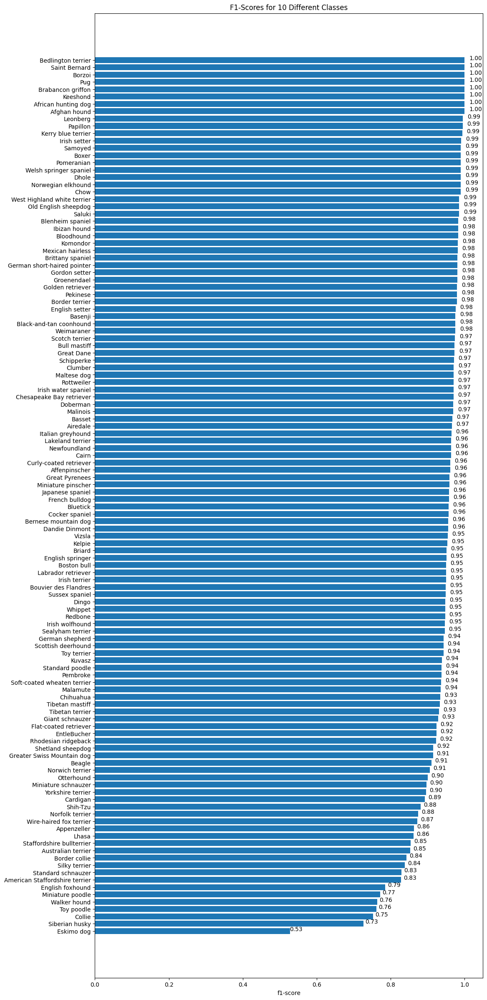

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 30))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(list(f1_scores["class_name"]))
ax.set_xlabel("f1-score")
ax.set_title("F1-Scores for 10 Different Classes")
ax.invert_yaxis();

def autolabel(rects):
  """
  Attach a text label above each bar displaying its height (it's value).
  """
  for rect in rects:
    width = rect.get_width()
    ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
            f"{width:.2f}",
            ha='center', va='bottom')

autolabel(scores)

Awesome! The absolute majority of our classes have F1 scores more than 0.95!

I will download this metric in a form of csv file. You can find it on my GitHub now.

In [ ]:
f1_scores.to_csv('f1_scores.csv')

Let's make a function that allows easy loading and preparing images.

In [ ]:
def load_and_prep_image(filename, img_shape=224, scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  (224, 224, 3).

  Parameters
  ----------
  filename (str): string filename of target image
  img_shape (int): size to resize target image to, default 224
  scale (bool): whether to scale pixel values to range(0, 1), default True
  """
  # Read in the image
  img = tf.io.read_file(filename)
  # Decode it into a tensor
  img = tf.io.decode_image(img)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  if scale:
    # Rescale the image (get all values between 0 and 1)
    return img/255.
  else:
    return img

Now, let's try to randomly select three images, predict them, and depict the prediction, prediction probability, and the actual breed of the dog on the image.

1/1 [==============================] - 0s 23ms/step


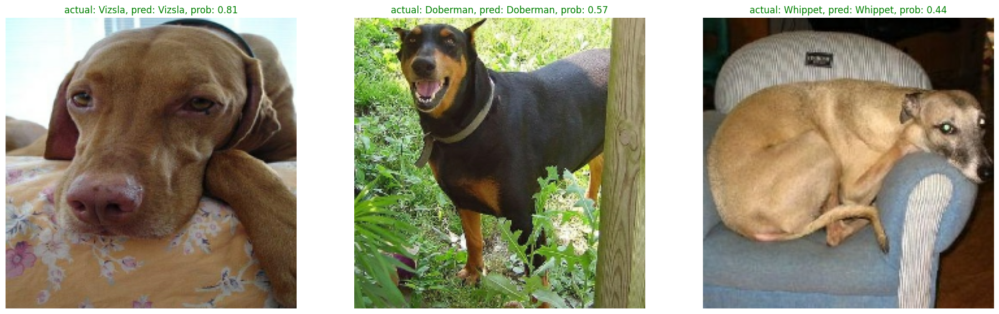

In [ ]:
plt.figure(figsize=(23, 10))
for i in range(3):
  # Choose a random image from a random class
  class_name = random.choice(class_names)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir + class_name + "/" + filename

  # Load the image and make predictions
  img = load_and_prep_image(filepath, scale=False)
  pred_prob = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()] # find the predicted class

  # Plot the image(s)
  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class: # Change the color of text based on whether prediction is right or wrong
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);

Great! All three randomly picked images were predicted correctly!

Initially, it looks like the probability of Whippet on the right-hand side picture was unsure, as it is only 44%. Nevertheless, we need to understand that **the other 56% were distributed among other 119 classes**!

### Finding the most wrong predictions

It is time to check where our model makes more mistakes and where it makes the worst mistakes!

Firstly, get the filenames of all of our test data.

In [ ]:
filepaths = []
for filepath in val_ds.list_files("data/test/*/*.jpg",
                                     shuffle=False):
  filepaths.append(filepath.numpy())
filepaths[:10]

[b'data/test/Affenpinscher/n02110627_3972_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4086_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4130_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4275_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4433_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4457_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4542_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4597_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_4607_cropped.jpg',
 b'data/test/Affenpinscher/n02110627_475_cropped.jpg']

Secondly, create a dataframe out of current prediction data for analysis.

In [ ]:
pred_df = pd.DataFrame({"img_path": filepaths,
                        "y_true": y_labels,
                        "y_pred": pred_classes,
                        "pred_conf": pred_probs.max(axis=1),
                        "y_true_classname": [class_names[i] for i in y_labels],
                        "y_pred_classname": [class_names[i] for i in pred_classes]})
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'data/test/Affenpinscher/n02110627_3972_cropp...,0,0,0.999148,Affenpinscher,Affenpinscher
1,b'data/test/Affenpinscher/n02110627_4086_cropp...,0,0,0.999572,Affenpinscher,Affenpinscher
2,b'data/test/Affenpinscher/n02110627_4130_cropp...,0,0,0.999342,Affenpinscher,Affenpinscher
3,b'data/test/Affenpinscher/n02110627_4275_cropp...,0,0,0.998566,Affenpinscher,Affenpinscher
4,b'data/test/Affenpinscher/n02110627_4433_cropp...,0,0,0.997782,Affenpinscher,Affenpinscher


Then, let's add "is the prediction correct" column.

In [ ]:
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'data/test/Affenpinscher/n02110627_3972_cropp...,0,0,0.999148,Affenpinscher,Affenpinscher,True
1,b'data/test/Affenpinscher/n02110627_4086_cropp...,0,0,0.999572,Affenpinscher,Affenpinscher,True
2,b'data/test/Affenpinscher/n02110627_4130_cropp...,0,0,0.999342,Affenpinscher,Affenpinscher,True
3,b'data/test/Affenpinscher/n02110627_4275_cropp...,0,0,0.998566,Affenpinscher,Affenpinscher,True
4,b'data/test/Affenpinscher/n02110627_4433_cropp...,0,0,0.997782,Affenpinscher,Affenpinscher,True


Finally, get the top 100 wrong examples.

In [ ]:
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
8229,b'data/test/Wire-haired fox terrier/n02095314_...,118,98,0.998871,Wire-haired fox terrier,Sealyham terrier,False
3371,b'data/test/Gordon setter/n02101006_8651_cropp...,50,56,0.998758,Gordon setter,Irish setter,False
7552,b'data/test/Sussex spaniel/n02102480_8187_crop...,107,31,0.998693,Sussex spaniel,Clumber,False
5054,b'data/test/Mexican hairless/n02113978_3349_cr...,74,29,0.998557,Mexican hairless,Chihuahua,False
6679,b'data/test/Schipperke/n02104365_9552_cropped....,95,54,0.998508,Schipperke,Groenendael,False
7514,b'data/test/Sussex spaniel/n02102480_6483_crop...,107,58,0.998452,Sussex spaniel,Irish water spaniel,False
1556,b'data/test/Bouvier des Flandres/n02106382_456...,20,23,0.998111,Bouvier des Flandres,Briard,False
8207,b'data/test/Wire-haired fox terrier/n02095314_...,118,98,0.997664,Wire-haired fox terrier,Sealyham terrier,False
1542,b'data/test/Bouvier des Flandres/n02106382_416...,20,23,0.996379,Bouvier des Flandres,Briard,False
5433,b'data/test/Norfolk terrier/n02094114_4361_cro...,79,17,0.995505,Norfolk terrier,Border terrier,False


And now let's depict these incorrect predictions.

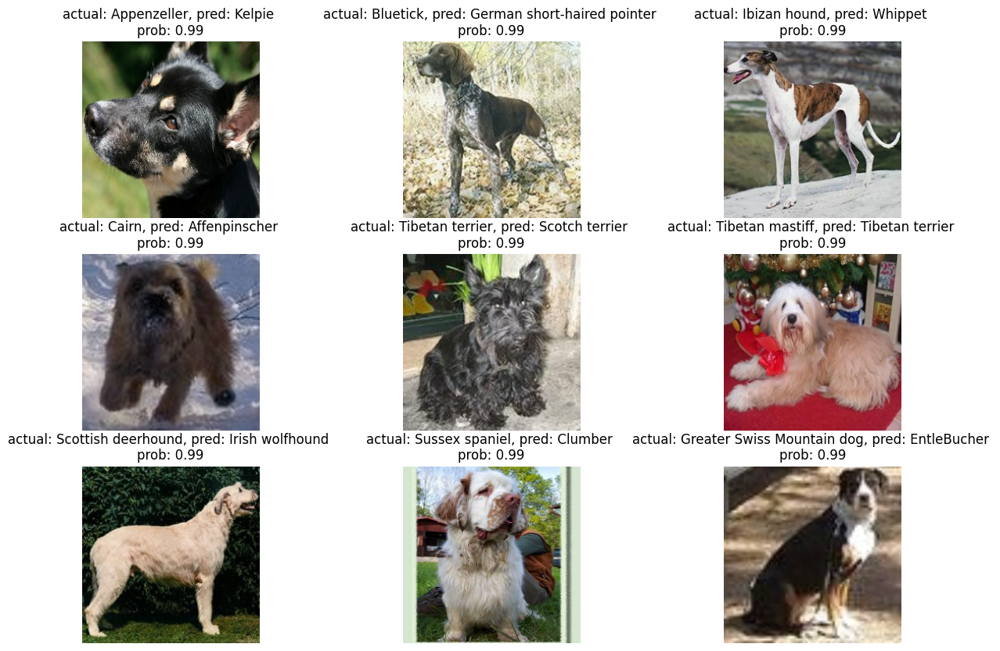

In [ ]:
images_to_view = 9
start_index = 10
plt.figure(figsize=(15, 10))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
  plt.subplot(3, 3, i+1)
  img = load_and_prep_image(row[1], scale=True)
  _, _, _, _, pred_prob, y_true, y_pred, _ = row
  plt.imshow(img)
  plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
  plt.axis(False)

## Training on the whole set


And now we want to train on the whole dataset to ensure that our model learns from as much relevant data as possible, maximizing its ability to generalize and perform well on unseen examples. Training on a larger dataset can help improve model robustness, reduce overfitting by capturing diverse patterns, and enhance its ability to handle various real-world scenarios effectively.

In [ ]:
images_numbers_array = []
for dirpath, dirnames, filenames in os.walk('fine_tuning'):
    if len(filenames) !=0:
      images_numbers_array.append(len(filenames))

In [ ]:
print(f'The maximum number of images in all the folders is {max(images_numbers_array)},\n\
Minimum number is {min(images_numbers_array)}, \n\
Thу average number is {np.mean(images_numbers_array)}:')

The maximum number of images in all the folders is 504,
Minimum number is 296, 
Thу average number is 343.0:


Hence, as the minimum number of images per category is 296, let's make sure each category has at least this number of examples during training. Balancing the dataset in this way helps prevent the model from being biased towards classes with more data, ensuring fair representation and improving overall performance across all categories.

In [ ]:
make_train_test_folders('fine_tuning', 'final_training', images_for_train=296)

In [ ]:
final_train_dir = '/content/final_training/train'
final_test_dir = '/content/final_training/test'

final_train_ds = tf.keras.utils.image_dataset_from_directory(final_train_dir,
                                                       seed = 42,
                                                       image_size = (IMG_HEIGHT, IMG_WIDTH),
                                                       batch_size = BATCH_SIZE,
                                                       label_mode = 'categorical')



Found 35520 files belonging to 120 classes.


In [ ]:
final_val_ds = tf.keras.utils.image_dataset_from_directory(final_test_dir,
                                                       seed = 42,
                                                       image_size = (IMG_HEIGHT, IMG_WIDTH),
                                                       batch_size = BATCH_SIZE,
                                                       shuffle = False,
                                                       label_mode = 'categorical')

Found 5640 files belonging to 120 classes.


Now, we have a large training dataset consisting of 35520 images. Even though we create a validation dataset, our validation accuracy may not be truly representative. We aim to evaluate all our models using the same validation set, but it's not feasible under the current circumstances.

In [ ]:
EfficientNetV2B3_model.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005),
                metrics=["accuracy"])

In [ ]:
EfficientNetV2B3_model.fit(final_train_ds,
                           epochs = 3,
                           validation_data=final_val_ds)

Epoch 1/3
1110/1110 [==============================] - 43s 29ms/step - loss: 0.2318 - accuracy: 0.9422 - val_loss: 0.2303 - val_accuracy: 0.9385
Epoch 2/3
1110/1110 [==============================] - 29s 26ms/step - loss: 0.2040 - accuracy: 0.9452 - val_loss: 0.2167 - val_accuracy: 0.9395
Epoch 3/3
1110/1110 [==============================] - 29s 26ms/step - loss: 0.1866 - accuracy: 0.9480 - val_loss: 0.2087 - val_accuracy: 0.9395


And now we want to save our comprehensive model that was trained, fine-tuned, and ultimately fine-tuned a second time using the whole dataset!

In [ ]:
EfficientNetV2B3_model.save('The_best_model.h5')

In this project, I have explored various techniques for predicting dog breeds from images. I started by loading and preparing the dataset and then used traditional convolutional networks. I also experimented with data augmentation to improve the results. Hyperparameter tuning and transfer learning, using feature extraction with different base models such as EfficientNetB0, were important steps in increasing the model's accuracy. Fine-tuning these models further improved their performance.

Despite facing challenges, such as identifying and addressing incorrect predictions, the overall journey has been enlightening. In the future, I plan to create a version 2.0 of this project that includes a wider range of dog breeds. The final working application will be hosted [on my personal website](https://vlad-ds.pro/projects/deep_learning/dog_breeds/), showcasing the culmination of my efforts to deploy an efficient and accurate dog breed prediction system.

Thank you for your time! If you have any questions, please reach out to me!

Vladislav Kuznetsov

[My LinkedIn](https://www.linkedin.com/in/vl-kuz/)

[My GitHub](https://github.com/VladKuzR)

My Email: vl.kuz.ru@gmail.com

Phone Number: +1 347 459 49 84
